<a href="https://colab.research.google.com/github/D30p/PR2-Code-Graph-Animation/blob/main/INI%20GRAFIK_13123103_OLIVIERY%20AMADEO%20EIDE%20RUSLI_PR%202.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***13123103***

# ***untuk nomor 1 ada perbaikan yang sudah diupload dalam file REVISI!!!!!!!!, Terima kasih***

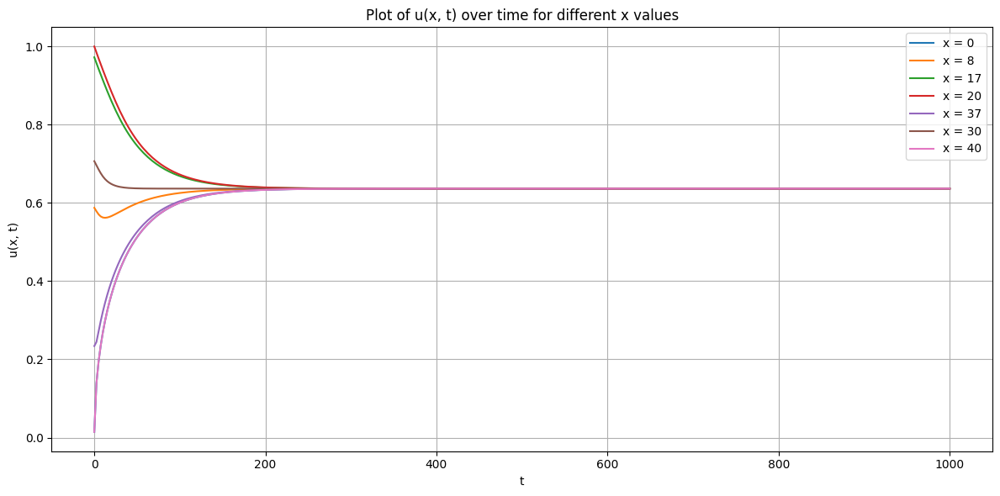

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def u_xt(x, t, N_terms=50):
    result = 2 / np.pi
    for n in range(2, N_terms + 1):
        if n % 2 == 0:
            coeff = ((-1)**n + 1) / (1 - n**2)
            term = coeff * np.cos(n * np.pi * x / 40) * np.exp(-((n * np.pi / 40)**2) * t)
            result += (2 / np.pi) * term
    return result

# Define time values
t_vals = np.linspace(0.01, 1000, 400)

# x positions to evaluate
x_values = [0, 8, 17, 20, 37, 30, 40]

# Plotting
plt.figure(figsize=(12, 6))
for x_fixed in x_values:
    u_vals = [u_xt(x_fixed, t) for t in t_vals]
    plt.plot(t_vals, u_vals, label=f'x = {x_fixed}')

plt.xlabel("t")
plt.ylabel("u(x, t)")
plt.title("Plot of u(x, t) over time for different x values")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

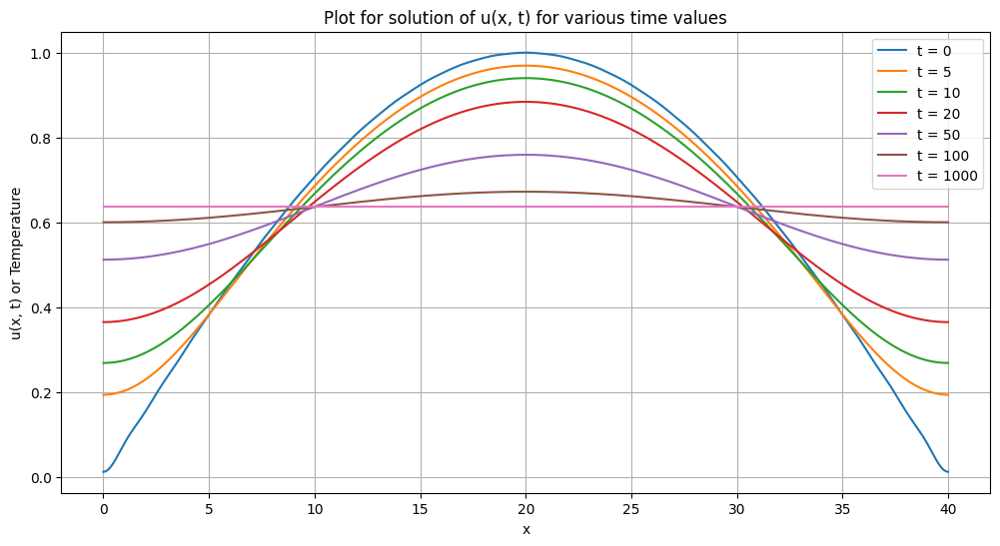

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def u_xt(x, t, N_terms=50):
    result = 2 / np.pi
    for n in range(2, N_terms + 1):
        if n % 2 == 0:
            coeff = ((-1)**n + 1) / (1 - n**2)
            term = coeff * np.cos(n * np.pi * x / 40) * np.exp(-((n * np.pi / 40)**2) * t)
            result += (2 / np.pi) * term
    return result

# x from 0 to 40 (excluding exact 0 and 40)
x_vals = np.linspace(0.01, 39.99, 400)

# t values to plot
t_values = [0, 5, 10, 20, 50, 100, 1000]

plt.figure(figsize=(12, 6))
for t in t_values:
    u_vals = [u_xt(x, t) for x in x_vals]
    plt.plot(x_vals, u_vals, label=f't = {t}')

plt.xlabel("x")
plt.ylabel("u(x, t) or Temperature")
plt.title("Plot for solution of u(x, t) for various time values")
plt.legend()
plt.grid(True)
plt.show()

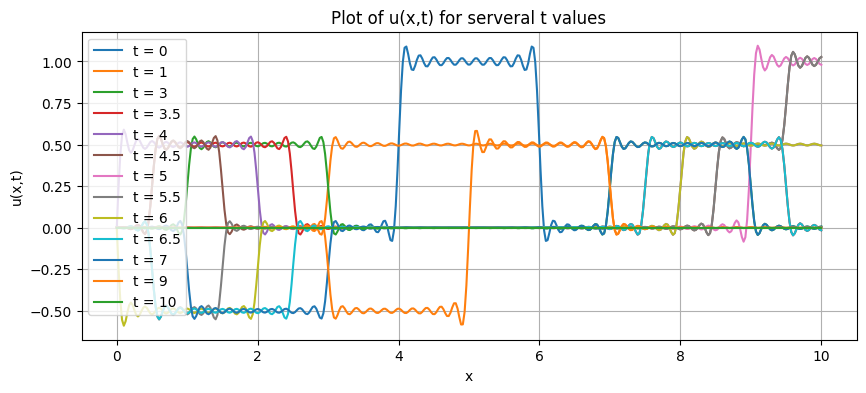

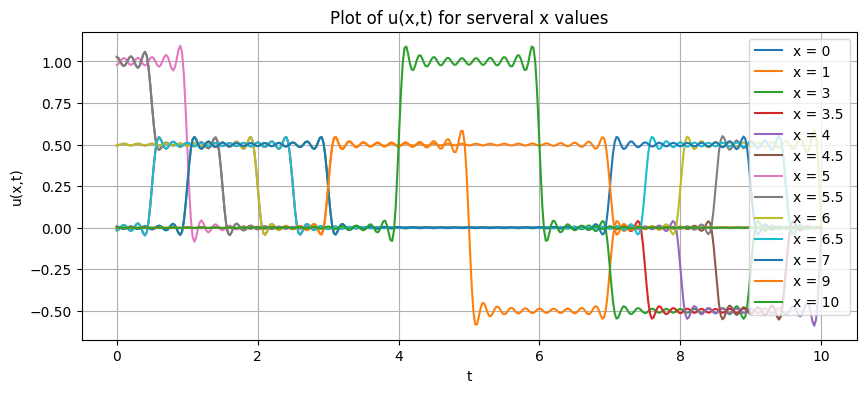

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# approximate pi
pi = np.pi

# Define function u(x, t) in a really “noob” way
def u(x, t):
    N = 100
    out = []
    # loop over each x-value
    for xi in x:
        total = 0.0
        # sum the odd harmonics
        for n in range(1, N+1):
            k = 2*n - 1
            # break coeff into parts
            A = 8 / (pi * k)
            B = np.sin(pi * k / 4)
            C = np.sin(pi * k / 20)
            coeff = A * B * C
            # spatial and temporal parts
            spat = np.sin(pi * k * xi / 20)
            temp = np.cos(pi * k * t / 20)
            # accumulate
            total = total + coeff * spat * temp
        out.append(total)
    return out

# Create x and t arrays
xs = np.linspace(0, 10, 400)
ts = np.linspace(0, 10, 400)

# Plot u(x) for several fixed t’s
ts_fixed = [0, 1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 9, 10]
plt.figure(figsize=(10, 4))
for tf in ts_fixed:
    y = u(xs, tf)
    plt.plot(xs, y, label='t = ' + str(tf))
plt.title('Plot of u(x,t) for serveral t values')
plt.xlabel('x')
plt.ylabel('u(x,t)')
plt.legend()
plt.grid()
plt.show()

# Plot u(t) for several fixed x’s
xs_fixed = [0, 1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 9, 10]
plt.figure(figsize=(10, 4))
for xf in xs_fixed:
    uvs = []
    # call u() for a single x each time
    for ti in ts:
        val = u([xf], ti)[0]
        uvs.append(val)
    plt.plot(ts, uvs, label='x = ' + str(xf))
plt.title('Plot of u(x,t) for serveral x values')
plt.xlabel('t')
plt.ylabel('u(x,t)')
plt.legend()
plt.grid()
plt.show()

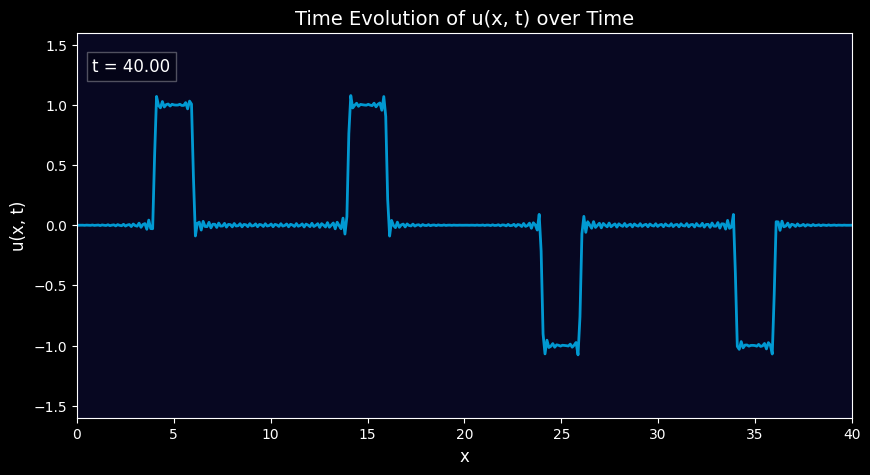

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define u(x, t)
def u(x, t, N=75):
    x = np.array(x)
    u_val = np.zeros_like(x, dtype=float)
    for n in range(1, N + 1):
        k = 2 * n - 1
        coeff = (8 / (np.pi * k)) * np.sin(np.pi * k / 4) * np.sin(np.pi * k / 20)
        spatial = np.sin(np.pi * k * x / 20)
        temporal = np.cos(np.pi * k * t / 20)
        u_val += coeff * spatial * temporal
    return u_val

# Domains
x_vals = np.linspace(0, 40, 400)
t_vals = np.linspace(0, 40, 200)

# Plot style
plt.style.use('dark_background')

# Set up figure
fig, ax = plt.subplots(figsize=(10, 5))
line, = ax.plot([], [], lw=2, color='deepskyblue', alpha=0.8)
ax.set_xlim(0, 40)
ax.set_ylim(-1.6, 1.6)
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('u(x, t)', fontsize=12)
ax.set_title('Time Evolution of u(x, t) over Time', fontsize=14)
time_text = ax.text(0.02, 0.90, '', transform=ax.transAxes, color='white', fontsize=12, bbox=dict(facecolor='black', alpha=0.3))

# Optional background gradient fill
gradient = ax.fill_between(x_vals, -1.6, 1.6, color='midnightblue', alpha=0.3)

# Init function
def init():
    line.set_data([], [])
    time_text.set_text('')
    return line, time_text

# Update function
def update(frame):
    y = u(x_vals, frame)
    line.set_data(x_vals, y)
    time_text.set_text(f't = {frame:.2f}')
    return line, time_text

# Animate
ani = FuncAnimation(fig, update, frames=t_vals, init_func=init, blit=True, interval=50)

# Display in notebook
HTML(ani.to_jshtml())

# No. 2e. Gerakan gelombang pada tali tersebut akan tampak seperti dua gelombang yang sama datang dari arah berlawanan dan berkebalikan orientasi. Tampak adanya superposisi konstruktif dan destruktif terjadi. Hal ini dimungkinkan karena kedua ujung tali diikat, sehingga agar gelombang tetap menjalar, maka gelombang harus bergerak bulak-balik.

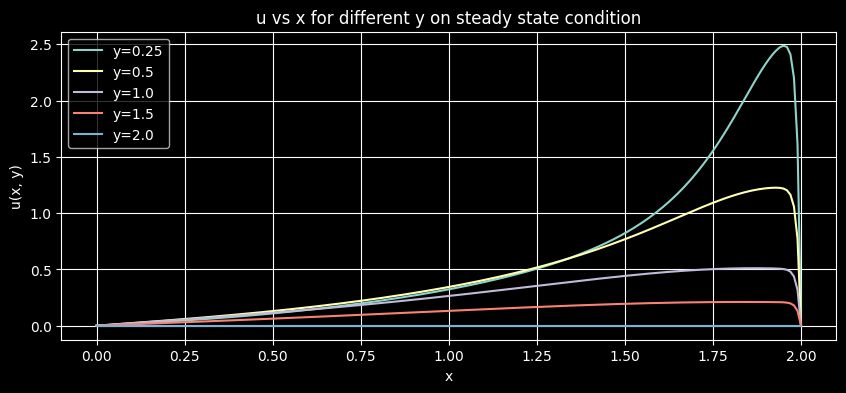

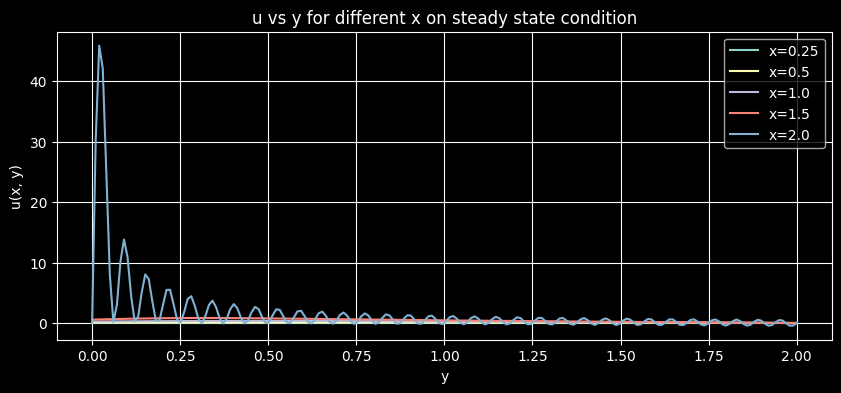

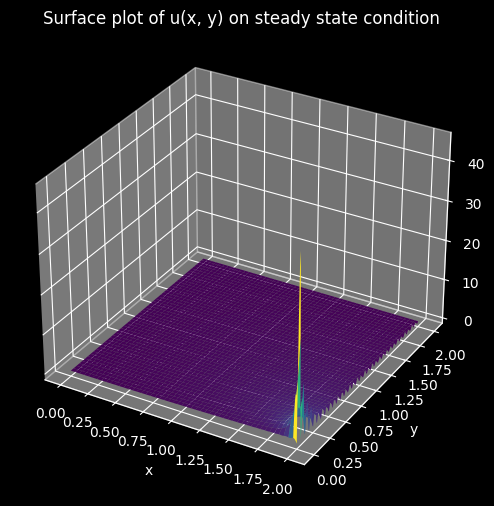

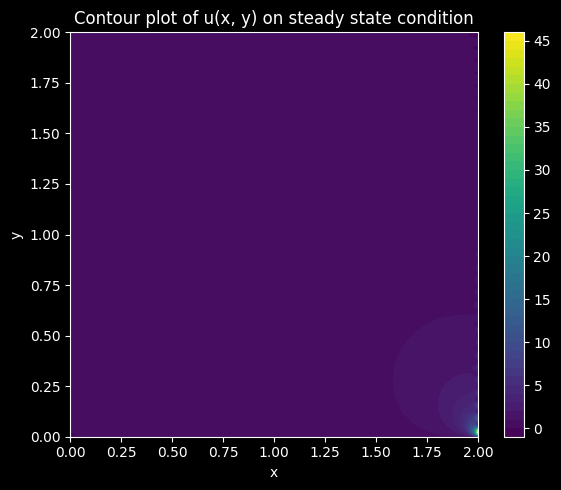

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Constants
a = 2
b = 2
N = 64 # Truncation limit

# Domain
x = np.linspace(0, a, 200)
y = np.linspace(0, b, 200)
X, Y = np.meshgrid(x, y)

def compute_u(X, Y):
    u1 = np.zeros_like(X)
    u2 = np.zeros_like(X)

    for n in range(1, N + 1):
        n_pi = n * np.pi
        tanh_term = np.tanh(n_pi * b / a)
        sinh_x_a = np.sinh(n_pi * X / a)
        sinh_y_a = np.sinh(n_pi * Y / a)
        cosh_y_a = np.cosh(n_pi * Y / a)
        sin_x_a = np.sin(n_pi * X / a)

        term1_coeff = (2 / (n ** 3 * np.pi ** 3)) * (((n ** 2 * np.pi ** 2 - 2) * np.cos(n_pi) + 2) / tanh_term)
        u1 += term1_coeff * sin_x_a * (sinh_y_a - tanh_term * cosh_y_a)

        sinh_x_b = np.sinh(n_pi * X / b)
        sin_y_b = np.sin(n_pi * Y / b)
        denom = np.sinh(n_pi * a / b)
        if denom != 0:
            u2 += (2 / b) * (1 / denom) * sin_y_b * sinh_x_b

    return u1 + u2

# Compute u over grid
U = compute_u(X, Y)

# Plot 1: u vs x for fixed y
plt.figure(figsize=(10, 4))
for y_val in [0.25, 0.5, 1.0, 1.5, 2.0]:
    u_vals = compute_u(x, y_val * np.ones_like(x))
    plt.plot(x, u_vals, label=f'y={y_val}')
plt.title("u vs x for different y on steady state condition")
plt.xlabel('x')
plt.ylabel('u(x, y)')
plt.legend()
plt.grid(True)

# Plot 2: u vs y for fixed x
plt.figure(figsize=(10, 4))
for x_val in [0.25, 0.5, 1.0, 1.5, 2.0]:
    u_vals = compute_u(x_val * np.ones_like(y), y)
    plt.plot(y, u_vals, label=f'x={x_val}')
plt.title("u vs y for different x on steady state condition")
plt.xlabel('y')
plt.ylabel('u(x, y)')
plt.legend()
plt.grid(True)

# Plot 3: Surface plot with interactive rotation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, U, cmap='viridis')

ax.set_title("Surface plot of u(x, y) on steady state condition")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("u")

# Use interactive mode to allow for rotation in the notebook (This is for Jupyter Notebooks)
plt.ion()  # Turns on interactive mode
plt.show()

# Plot 4: Contour plot
plt.figure(figsize=(6, 5))
cp = plt.contourf(X, Y, U, levels=50, cmap='viridis')
plt.title("Contour plot of u(x, y) on steady state condition")
plt.xlabel("x")
plt.ylabel("y")
plt.colorbar(cp)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go

# Constants
a = 2
b = 2
N = 64 # Truncation limit

# Domain
x = np.linspace(0, a, 200)
y = np.linspace(0, b, 200)
X, Y = np.meshgrid(x, y)

def compute_u(X, Y):
    u1 = np.zeros_like(X)
    u2 = np.zeros_like(X)

    for n in range(1, N + 1):
        n_pi = n * np.pi
        tanh_term = np.tanh(n_pi * b / a)
        sinh_x_a = np.sinh(n_pi * X / a)
        sinh_y_a = np.sinh(n_pi * Y / a)
        cosh_y_a = np.cosh(n_pi * Y / a)
        sin_x_a = np.sin(n_pi * X / a)

        term1_coeff = (2 / (n ** 3 * np.pi ** 3)) * (((n ** 2 * np.pi ** 2 - 2) * np.cos(n_pi) + 2) / tanh_term)
        u1 += term1_coeff * sin_x_a * (sinh_y_a - tanh_term * cosh_y_a)

        sinh_x_b = np.sinh(n_pi * X / b)
        sin_y_b = np.sin(n_pi * Y / b)
        denom = np.sinh(n_pi * a / b)
        if denom != 0:
            u2 += (2 / b) * (1 / denom) * sin_y_b * sinh_x_b

    return u1 + u2

# Compute u over grid
U = compute_u(X, Y)

# Create the 3D plot using plotly
fig = go.Figure(data=[go.Surface(z=U, x=X, y=Y, colorscale='viridis')])

# Update layout for better presentation
fig.update_layout(
    title="Surface plot of u(x, y) on steady state condition",
    scene=dict(
        xaxis_title="x",
        yaxis_title="y",
        zaxis_title="u"
    ),
    autosize=True,
    margin=dict(l=0, r=0, b=0, t=50)
)

# Show the plot
fig.show()